# Filtering stressed cells

In [1]:
#load packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
library(Matrix)
library(dplyr)
library(RColorBrewer)
library(MAST)
library(viridis)
library(mclust)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
 

In [2]:
#loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/bcdRNAi/seu_HQC_bcdRNAi.obj")
seu_HQC

An object of class Seurat 
28978 features across 9223 samples within 2 assays 
Active assay: SCT (11474 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [3]:
Idents(seu_HQC) <- "seurat_clusters"

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


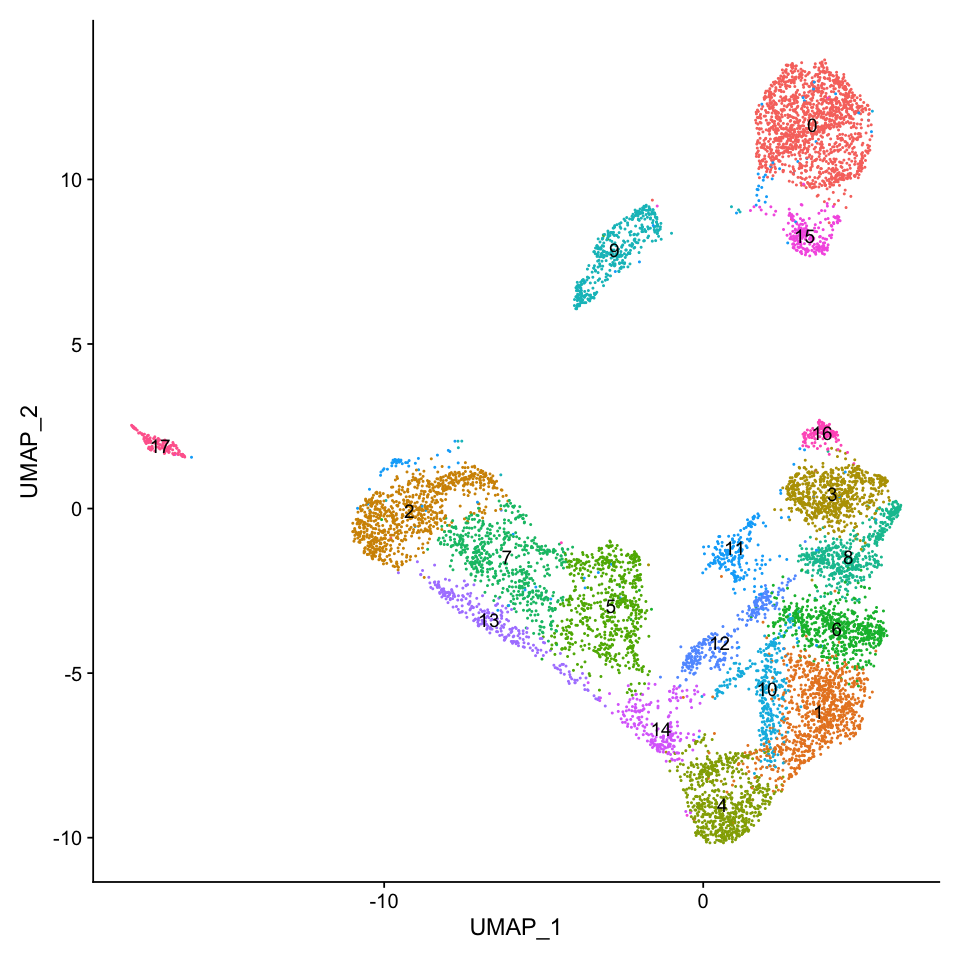

In [4]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

## Preprocessing

In [5]:
seu_HQC_polecell <- subset(seu_HQC, ident = c("17"))
seu_HQC_polecell

An object of class Seurat 
28978 features across 133 samples within 2 assays 
Active assay: SCT (11474 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [6]:
# pole cellを除く
seu_HQC_woPC <- subset(seu_HQC, ident = 17, invert = T)
seu_HQC_woPC

An object of class Seurat 
28978 features across 9090 samples within 2 assays 
Active assay: SCT (11474 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

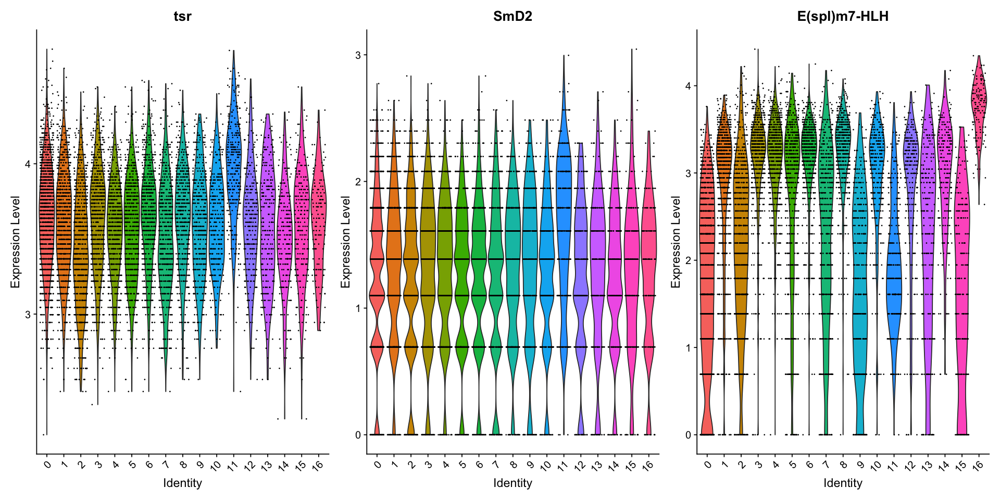

In [7]:
options(repr.plot.width=16, repr.plot.height=8)
VlnPlot(seu_HQC_woPC, c("tsr", "SmD2",  "E(spl)m7-HLH"), pt.size = 0.1)

In [8]:
#re-normalize without pole cells
DefaultAssay(seu_HQC_woPC) <- "RNA"
seu_HQC_woPC <- suppressWarnings(SCTransform(seu_HQC_woPC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

## Get tsr-correlated genes

In [9]:
HVG2000 <- head(VariableFeatures(seu_HQC_woPC), 2000)
length(HVG2000)
head(HVG2000)

[1] 2000

[1] "sog"   "peb"   "Abd-B" "Ilp4"  "SoxN"  "mirr"

In [10]:
seu_HQC_2000 <- seu_HQC_woPC[HVG2000,]
seu_HQC_2000

An object of class Seurat 
4000 features across 9090 samples within 2 assays 
Active assay: SCT (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [11]:
normcount <- GetAssayData(seu_HQC_2000)
dim(normcount)

[1] 2000 9090

In [12]:
normcount <- as.data.frame(t(normcount))
head(normcount)
dim(normcount)

,sog,peb,Abd-B,Ilp4,SoxN,mirr,ps,disco,ct,ImpL2,⋯,lncRNA:CR43302,nsl1,Axn,lncRNA:CR45035,CG14830,CG2926,CG7882,lncRNA:CR44718,Ir76b,Ptp4E
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGGTTCT,0.6931472,0.000000,0.000000,3.828641,1.0986123,0.6931472,0.000000,0.0000000,0.0000000,2.197225,⋯,0,1.098612,1.098612,0,0,1.609438,0,0.0000000,0,1.0986123
AAACCCACAAGACCTT,0.0000000,3.332205,2.302585,1.098612,0.0000000,3.2580965,1.098612,0.0000000,0.0000000,0.000000,⋯,0,0.000000,1.386294,0,0,1.791759,0,0.0000000,0,1.3862944
AAACCCACATGGAATA,1.9459101,1.098612,2.484907,1.945910,3.6375862,0.0000000,0.000000,0.0000000,0.0000000,2.079442,⋯,0,0.000000,1.098612,0,0,1.945910,0,0.0000000,0,1.3862944
AAACCCAGTTGTGGAG,0.0000000,0.000000,0.000000,4.204693,0.6931472,0.0000000,0.000000,0.0000000,0.0000000,1.098612,⋯,0,1.098612,0.000000,0,0,1.386294,0,0.0000000,0,0.0000000
AAACCCATCACAGAGG,1.3862944,2.564949,0.000000,1.609438,0.0000000,0.0000000,2.564949,0.6931472,0.0000000,1.098612,⋯,0,1.609438,1.386294,0,0,2.197225,0,0.0000000,0,0.6931472
AAACCCATCTGGGTCG,3.7376696,3.044522,0.000000,2.302585,3.2188758,2.6390573,0.000000,0.0000000,0.6931472,3.091042,⋯,0,1.386294,1.098612,0,0,1.791759,0,0.6931472,0,1.3862944


[1] 9090 2000

In [13]:
library(corrr)
corr <- correlate(normcount)


Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [14]:
corr_tsr <- focus(corr, "tsr")
corr_tsr <- na.omit(corr_tsr)
corr_tsr[order(-corr_tsr$tsr), ]

term,tsr
<chr>,<dbl>
His4r,0.5798190
alphaTub84B,0.5789829
Fkbp39,0.5584850
Ran,0.5355352
His3.3A,0.5332193
His3.3B,0.5146495
betaTub56D,0.5077980
Fer1HCH,0.5074712
Hel25E,0.5017890


In [15]:
corr_tsr <- corr_tsr[corr_tsr$tsr >0.45 | corr_tsr$tsr < -0.35, ]
dim(corr_tsr)
head(corr_tsr)

[1] 32  2

term,tsr
<chr>,<dbl>
mt:CoII,-0.3613333
mt:CoI,-0.3731407
mt:lrRNA,-0.3793682
mt:Cyt-b,-0.3803095
mt:ATPase6,-0.4497118
kis,-0.4147528


In [16]:
normcount_tsr_corr <- normcount[, c("tsr", corr_tsr$term) ]
head(normcount_tsr_corr)
dim(normcount_tsr_corr)

,tsr,mt:CoII,mt:CoI,mt:lrRNA,mt:Cyt-b,mt:ATPase6,kis,CG4440,betaTub56D,RpS19a,⋯,CG13551,me31B,Rpt4,His3.3A,ND-MLRQ,His3.3B,Ran,SmB,His4r,Hel25E
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGGTTCT,3.433987,5.327876,4.700480,3.688879,3.912023,3.806662,2.833213,3.433987,3.988984,4.262680,⋯,1.791759,1.6094379,1.7917595,2.639057,2.197225,2.564949,2.995732,2.197225,3.135494,2.079442
AAACCCACAAGACCTT,3.091042,5.513429,5.129899,4.077537,4.330733,4.304065,3.295837,4.094345,4.007333,4.189655,⋯,2.197225,0.6931472,0.6931472,2.302585,2.302585,2.564949,3.332205,1.945910,3.135494,2.302585
AAACCCACATGGAATA,3.295837,5.560682,5.153292,4.779123,4.430817,4.543295,3.218876,3.988984,3.737670,3.044522,⋯,2.484907,1.0986123,1.0986123,2.302585,2.564949,2.639057,3.178054,2.484907,3.218876,2.079442
AAACCCAGTTGTGGAG,3.988984,5.774552,5.192957,4.007333,4.406719,4.406719,1.609438,3.526361,4.406719,3.496508,⋯,2.079442,1.9459101,1.7917595,2.772589,1.609438,3.332205,3.465736,2.197225,3.178054,2.639057
AAACCCATCACAGAGG,3.135494,5.652489,5.030438,4.595120,4.189655,4.304065,2.302585,3.688879,3.433987,4.465908,⋯,2.079442,1.7917595,0.6931472,1.791759,1.945910,2.772589,2.484907,2.302585,2.995732,2.708050
AAACCCATCTGGGTCG,3.737670,5.908083,5.476464,4.718499,4.553877,4.644391,3.258097,3.951244,4.382027,4.077537,⋯,2.708050,2.3025851,2.3025851,2.484907,1.609438,2.708050,3.091042,2.197225,3.135494,2.639057


[1] 9090   33

In [17]:
pca<-prcomp(normcount_tsr_corr)
dim(pca$x)

[1] 9090   33

In [18]:
pca <- as.data.frame(pca$x)

In [19]:
head(pca)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGGTTCT,0.2995415,0.74650072,-0.41891799,0.31465522,-0.5850591,0.001427912,-0.23589744,0.70492407,0.1937326,-0.32947521,⋯,0.07468263,-0.02968904,-0.30657452,-0.372215102,-0.006227277,-0.008501922,-0.05910398,0.147176398,0.08480280,-0.095000969
AAACCCACAAGACCTT,-1.4294766,1.05569959,0.11368480,-0.13358665,0.6947771,0.490629631,0.52064389,-0.08572600,0.7563769,-0.01709881,⋯,-0.36674715,-0.23364984,0.22726798,-0.192719155,-0.089573391,0.254438019,-0.10393172,0.082826553,0.05288965,0.034616729
AAACCCACATGGAATA,-0.8745877,0.55440915,0.45678401,-0.01269974,0.5476543,-0.908665433,0.34001274,0.61680406,0.6803039,0.18166534,⋯,-0.08679039,0.22680155,0.12424100,0.884294512,0.091113211,0.169977893,-0.15710511,-0.002201731,-0.12666531,0.007803291
AAACCCAGTTGTGGAG,0.9297499,-0.77664608,0.02478693,-0.78273488,-0.7973993,-0.185828848,0.45289973,0.32465932,0.5206346,-0.57695894,⋯,0.20940505,0.18611599,0.03396725,0.118945799,-0.134653498,-0.196870129,-0.07202066,-0.069322295,-0.01338519,-0.033094667
AAACCCATCACAGAGG,-1.5102483,0.04155384,-1.01893235,0.23113674,0.1059053,0.503236484,-0.04760005,-1.00832062,-0.4247462,-0.21339852,⋯,-0.31439315,0.30240623,0.14133521,-0.002537963,0.025534090,0.079646589,0.21393439,0.036499460,0.10927473,-0.110356782
AAACCCATCTGGGTCG,-0.4289030,-0.72837905,1.33646564,0.62759036,-0.1214343,0.073337632,-0.52044005,0.05573669,-0.1992563,0.26567957,⋯,-0.22873338,0.01682807,-0.15685237,0.057480535,0.028909762,-0.128917536,-0.07476501,0.021445939,0.13935059,0.008408111


In [20]:
pca30 <- pca[, 1:30]
pca10 <- pca[, 1:10]

In [21]:
set.seed(256) 

library(viridis)
library(mclust)

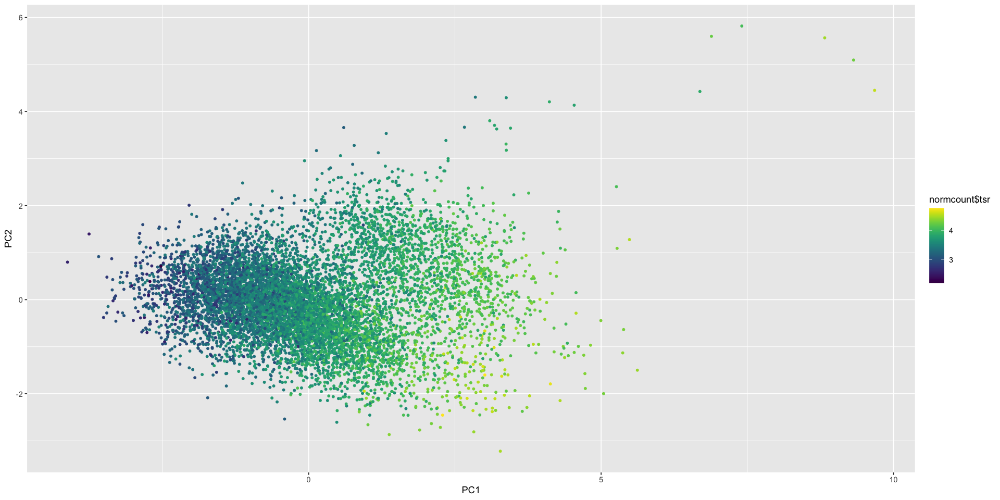

In [22]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = normcount$tsr))+ geom_point(size = 1)    + scale_color_viridis(option = "D")

In [23]:
mc <- Mclust(pca30,G=2,modelNames="VVV")

In [24]:
mc_result <- mc$classification 
mc_result <- as.data.frame(mc_result)
colnames(mc_result) <- c("stressed_ID_mc")
head(mc_result)

,stressed_ID_mc
,<dbl>
AAACCCAAGTGGTTCT,1
AAACCCACAAGACCTT,2
AAACCCACATGGAATA,2
AAACCCAGTTGTGGAG,2
AAACCCATCACAGAGG,2
AAACCCATCTGGGTCG,2


In [25]:

length(mc_result[mc_result$stressed_ID_mc==1, ])
length(mc_result[mc_result$stressed_ID_mc==2, ])

[1] 2676

[1] 6414

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,stressed_ID_mc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACCCAAGTGGTTCT,0.2995415,0.74650072,-0.41891799,0.31465522,-0.5850591,0.001427912,-0.23589744,0.70492407,0.1937326,-0.32947521,⋯,-0.02968904,-0.30657452,-0.372215102,-0.006227277,-0.008501922,-0.05910398,0.147176398,0.08480280,-0.095000969,1
AAACCCACAAGACCTT,-1.4294766,1.05569959,0.11368480,-0.13358665,0.6947771,0.490629631,0.52064389,-0.08572600,0.7563769,-0.01709881,⋯,-0.23364984,0.22726798,-0.192719155,-0.089573391,0.254438019,-0.10393172,0.082826553,0.05288965,0.034616729,2
AAACCCACATGGAATA,-0.8745877,0.55440915,0.45678401,-0.01269974,0.5476543,-0.908665433,0.34001274,0.61680406,0.6803039,0.18166534,⋯,0.22680155,0.12424100,0.884294512,0.091113211,0.169977893,-0.15710511,-0.002201731,-0.12666531,0.007803291,2
AAACCCAGTTGTGGAG,0.9297499,-0.77664608,0.02478693,-0.78273488,-0.7973993,-0.185828848,0.45289973,0.32465932,0.5206346,-0.57695894,⋯,0.18611599,0.03396725,0.118945799,-0.134653498,-0.196870129,-0.07202066,-0.069322295,-0.01338519,-0.033094667,2
AAACCCATCACAGAGG,-1.5102483,0.04155384,-1.01893235,0.23113674,0.1059053,0.503236484,-0.04760005,-1.00832062,-0.4247462,-0.21339852,⋯,0.30240623,0.14133521,-0.002537963,0.025534090,0.079646589,0.21393439,0.036499460,0.10927473,-0.110356782,2
AAACCCATCTGGGTCG,-0.4289030,-0.72837905,1.33646564,0.62759036,-0.1214343,0.073337632,-0.52044005,0.05573669,-0.1992563,0.26567957,⋯,0.01682807,-0.15685237,0.057480535,0.028909762,-0.128917536,-0.07476501,0.021445939,0.13935059,0.008408111,2


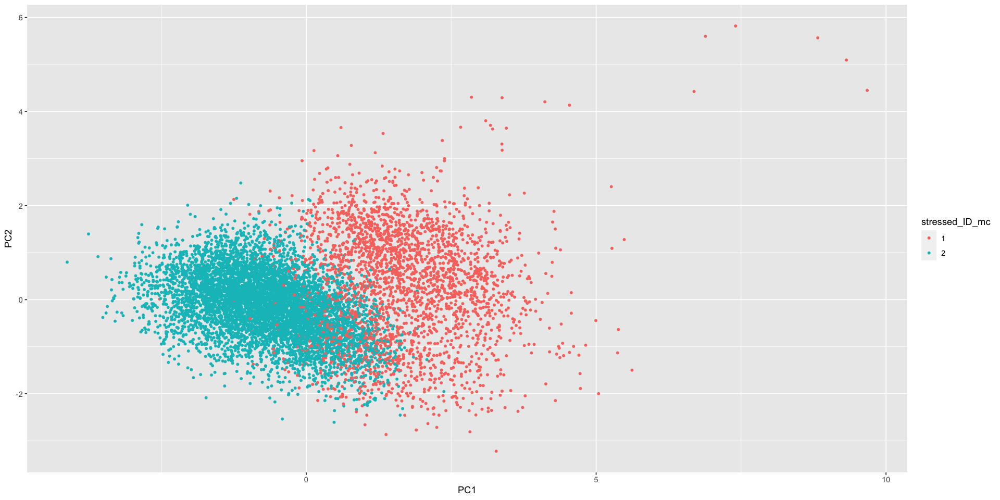

In [26]:
pca$stressed_ID_mc <- as.factor(mc_result$stressed_ID_mc)
head(pca)

options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = stressed_ID_mc))+ geom_point(size =1) 

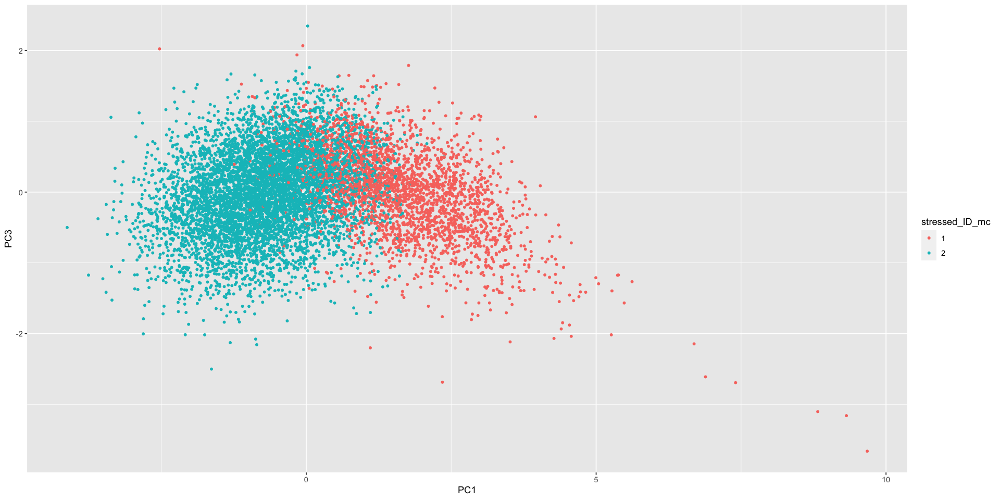

In [27]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC3 ,col = stressed_ID_mc))+ geom_point(size =1) 

In [28]:
seu_HQC_woPC$stressed_ID <- mc_result
seu_HQC_woPC

Idents(seu_HQC_woPC) <- "stressed_ID"

An object of class Seurat 
28940 features across 9090 samples within 2 assays 
Active assay: SCT (11436 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

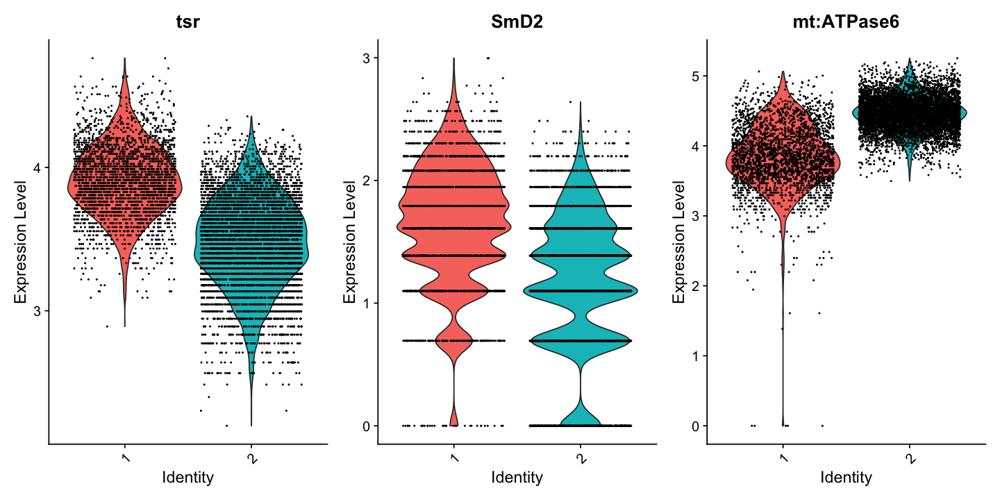

In [29]:
options(repr.plot.width=12, repr.plot.height=6)
VlnPlot(seu_HQC_woPC, features = c("tsr", "SmD2",  "mt:ATPase6"), pt.size = 0.2)

In [30]:
stress.markers <- FindAllMarkers(object = seu_HQC_woPC, only.pos = TRUE)
stress.markers.top20 <- stress.markers %>% group_by(cluster) %>% top_n(-20, wt = p_val_adj)
nrow(stress.markers.top20)

Calculating cluster 1

Calculating cluster 2



[1] 57

Warning message in DoHeatmap(seu_HQC_woPC, features = c(stress.markers.top20$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Syx1A, 14-3-3epsilon, ATPsynE, SF2, Fkbp12”


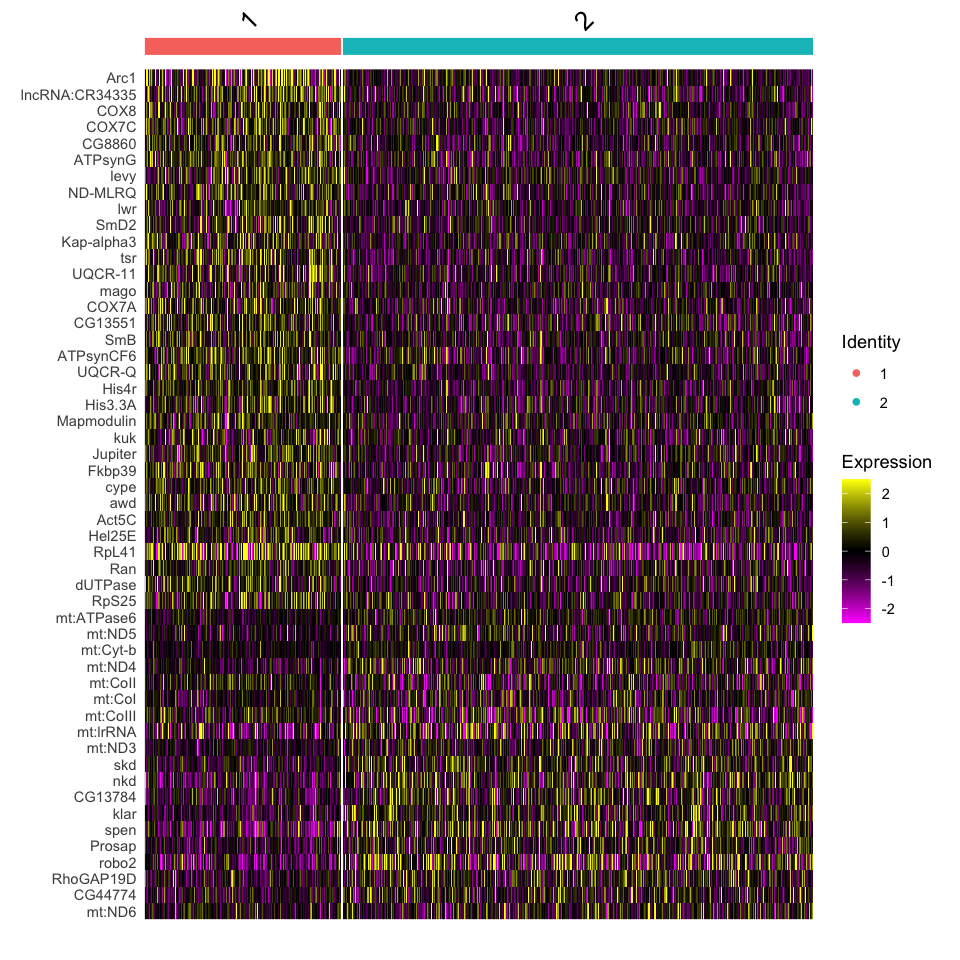

In [31]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_woPC, features = c(stress.markers.top20$gene))

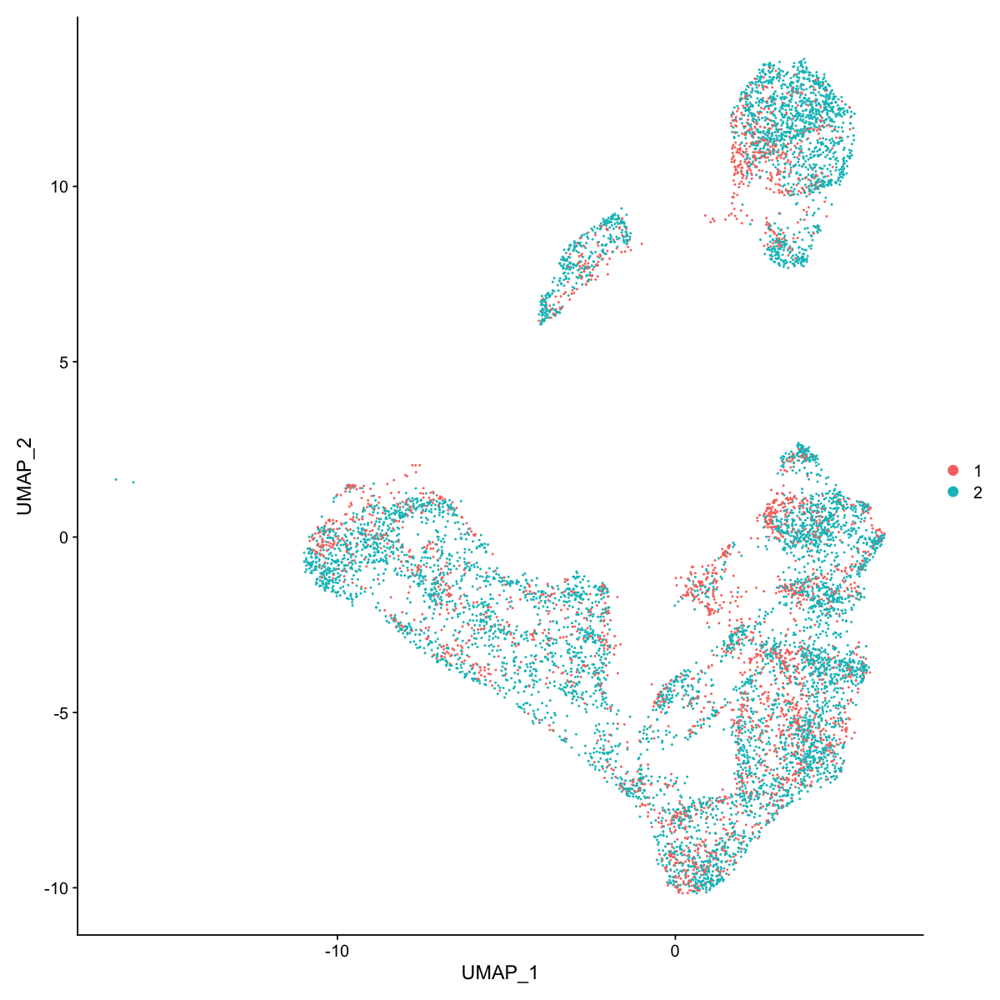

In [32]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seu_HQC_woPC, reduction =  "umap", label = F) 

In [33]:
head(mc_result)

,stressed_ID_mc
,<dbl>
AAACCCAAGTGGTTCT,1
AAACCCACAAGACCTT,2
AAACCCACATGGAATA,2
AAACCCAGTTGTGGAG,2
AAACCCATCACAGAGG,2
AAACCCATCTGGGTCG,2


In [34]:
nonstressed_list <- rownames(filter(mc_result, stressed_ID_mc==2))

In [35]:
length(nonstressed_list)

[1] 6414

In [36]:
polecell_list <- colnames(seu_HQC_polecell)
length(polecell_list)
head(polecell_list)

[1] 133

[1] "AAAGGATCATGGACAG" "AACCATGGTAGACTGG" "AACCTGATCACCTCAC" "AAGAACAGTGAGCGAT"
[5] "AATGAAGCAGAGGCAT" "AATGGCTTCATCCCGT"

In [37]:
keep_list <- c(nonstressed_list, polecell_list)
length(keep_list)

[1] 6547

In [38]:
seu_HQC2 <- seu_HQC
seu_HQC2

An object of class Seurat 
28978 features across 9223 samples within 2 assays 
Active assay: SCT (11474 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [39]:
seu_HQC2 <- seu_HQC2[, keep_list]

In [40]:
seu_HQC2

An object of class Seurat 
28978 features across 6547 samples within 2 assays 
Active assay: SCT (11474 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

## Clustering without stressed cells

In [41]:
seu_HQC2 <- suppressWarnings(SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


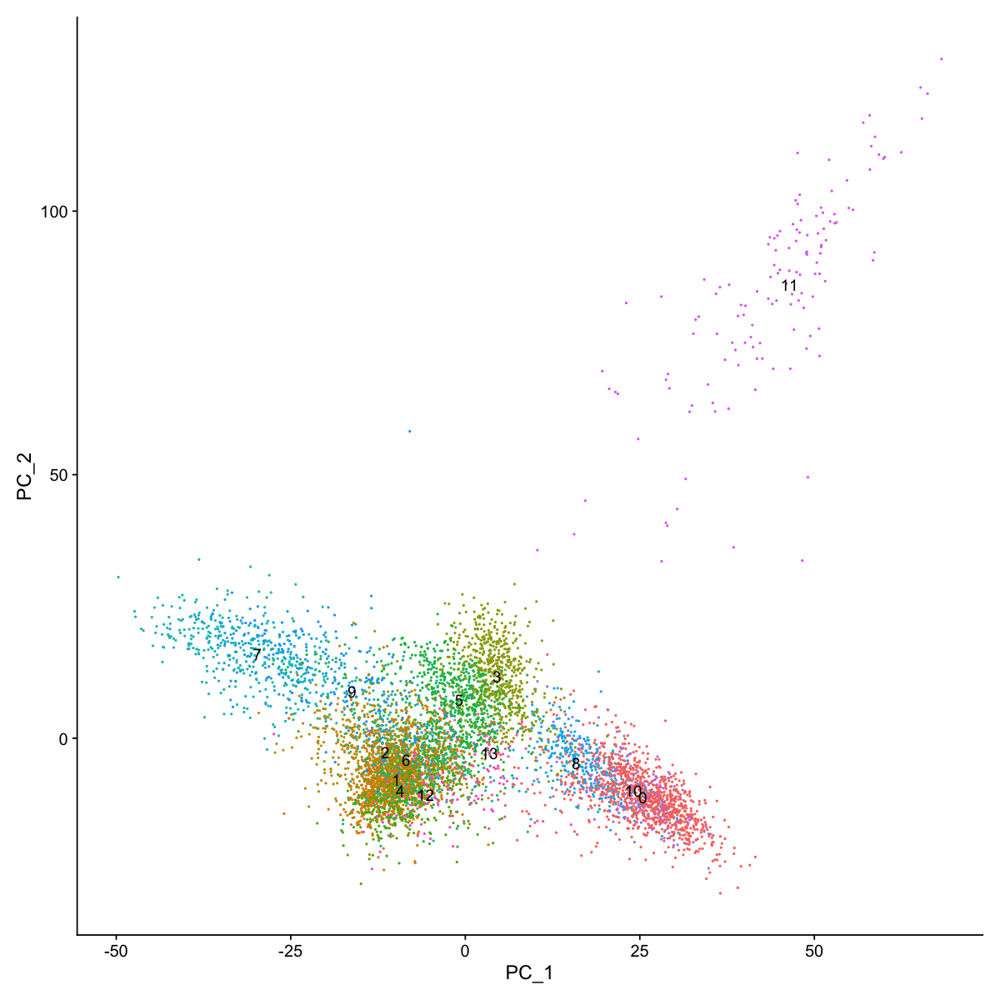

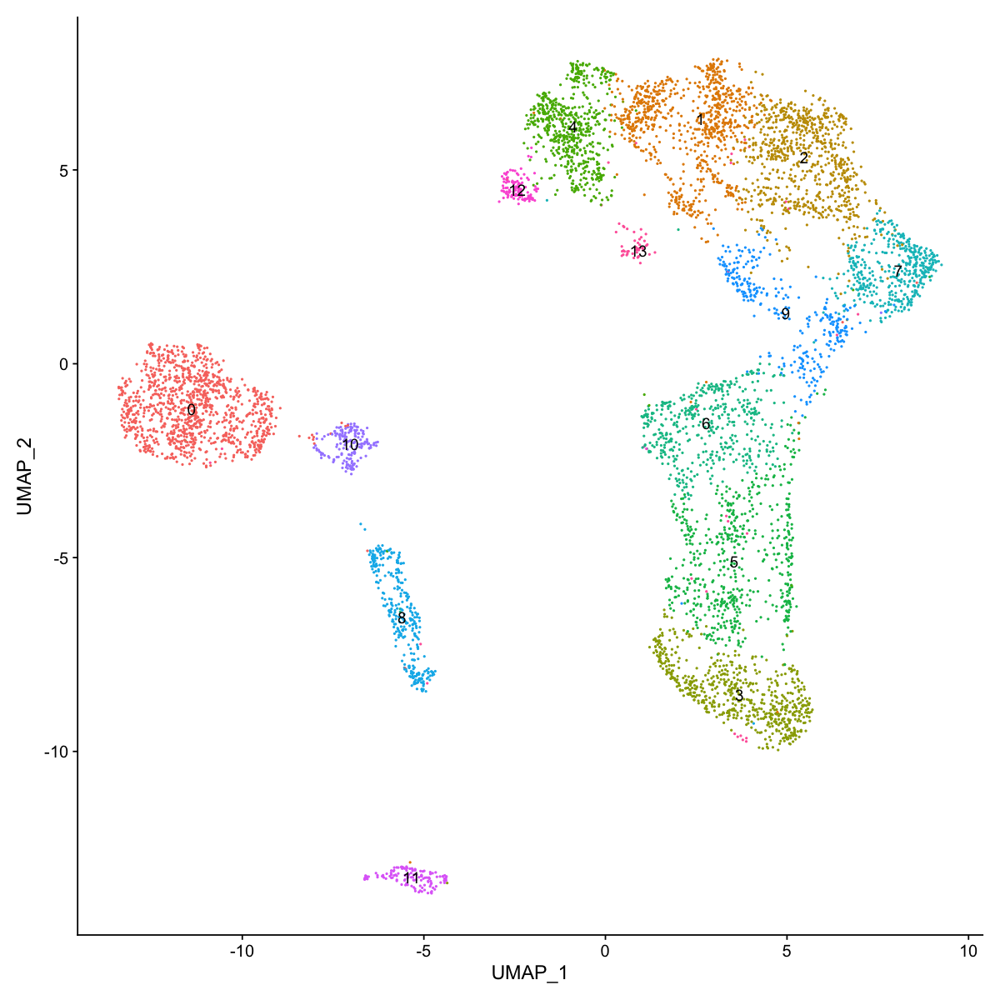

In [42]:
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

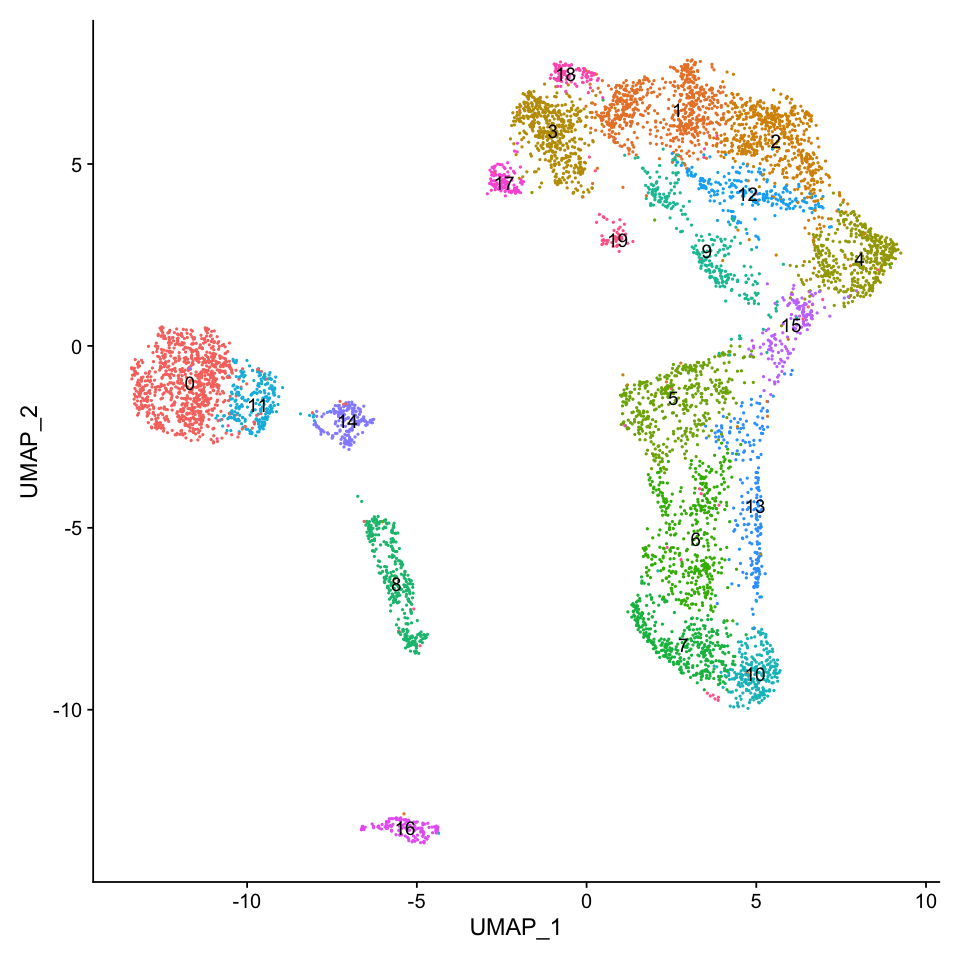

In [43]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE, resolution=1.1)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

In [44]:
all.markers2 <- FindAllMarkers(object = seu_HQC2, only.pos = TRUE)
all.markers2.top10 <- all.markers2 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19



Warning message in DoHeatmap(seu_HQC2, features = all.markers2.top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: GstO2, ND-ASHI”


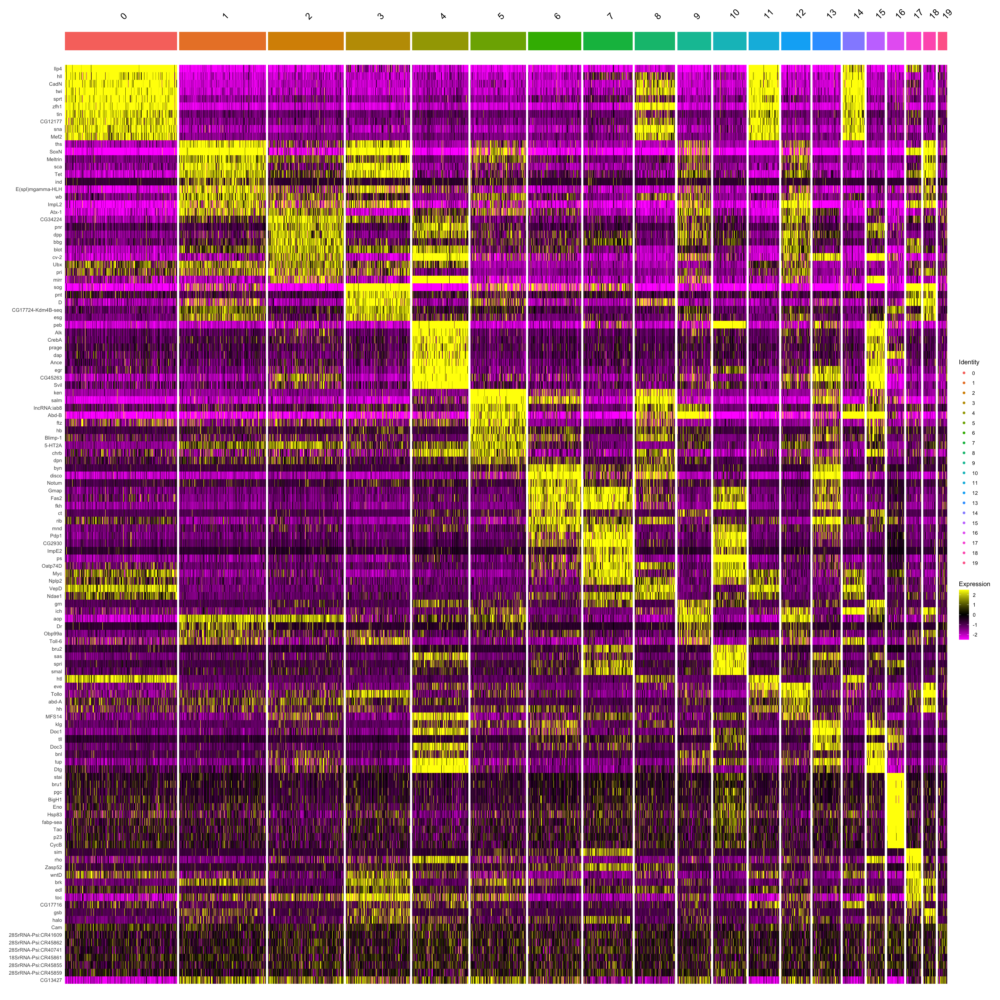

In [45]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers2.top10$gene)

In [46]:
# remove cluster 19, which has no clear maker genes
seu_HQC2 <- subset(seu_HQC2, ident = c("19"), invert = T)
seu_HQC2

An object of class Seurat 
28614 features across 6473 samples within 2 assays 
Active assay: SCT (11110 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

## Clustering again

In [47]:
DefaultAssay(seu_HQC2) <- "RNA"
seu_HQC2 <- suppressWarnings(SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

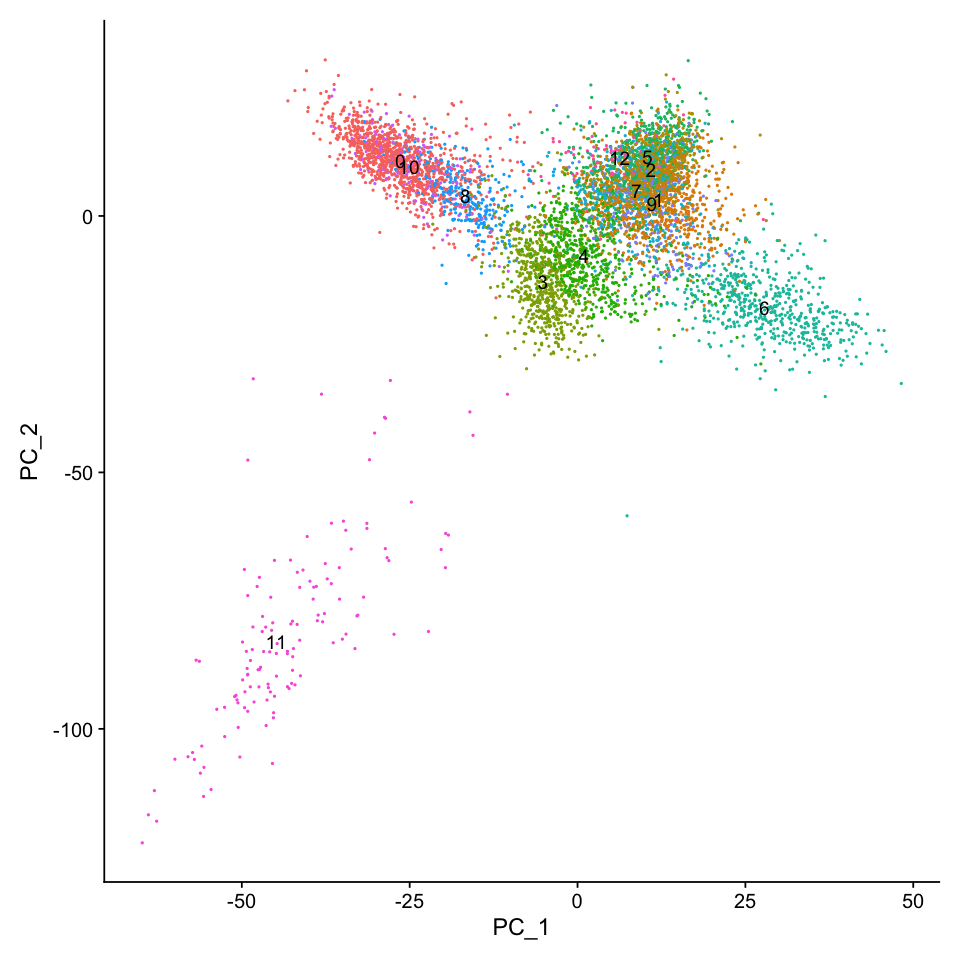

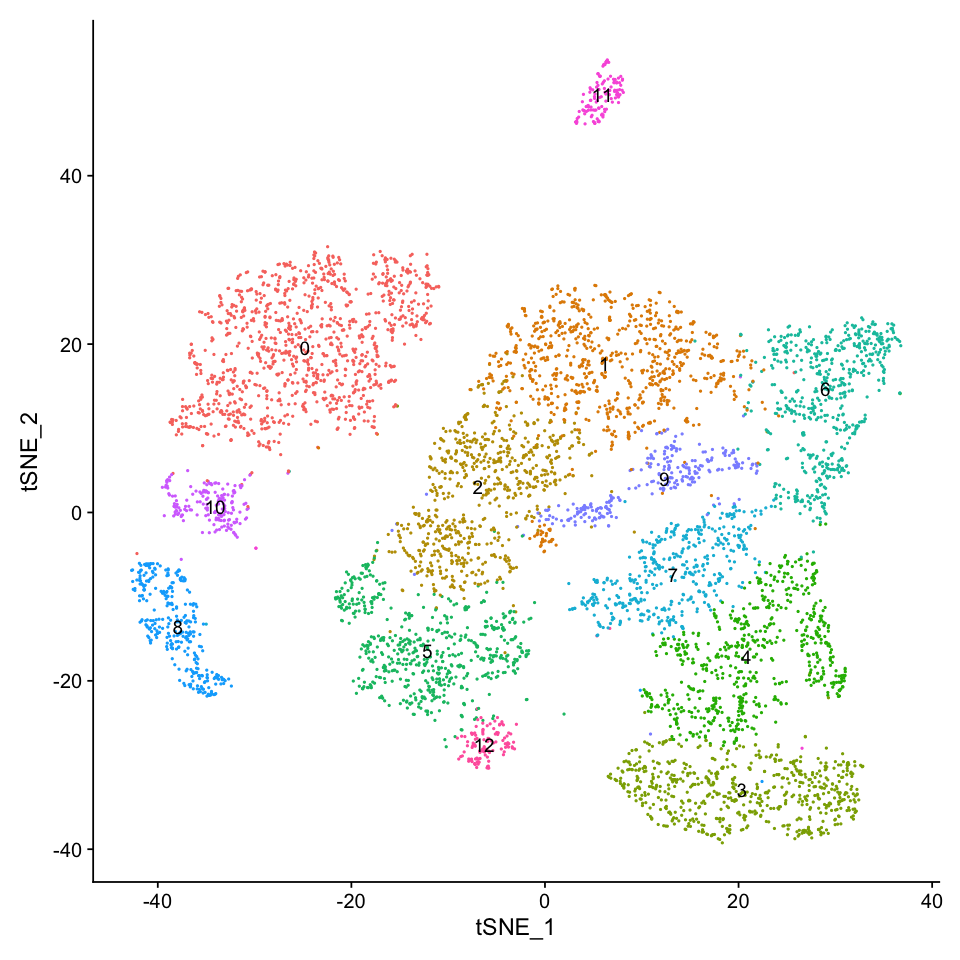

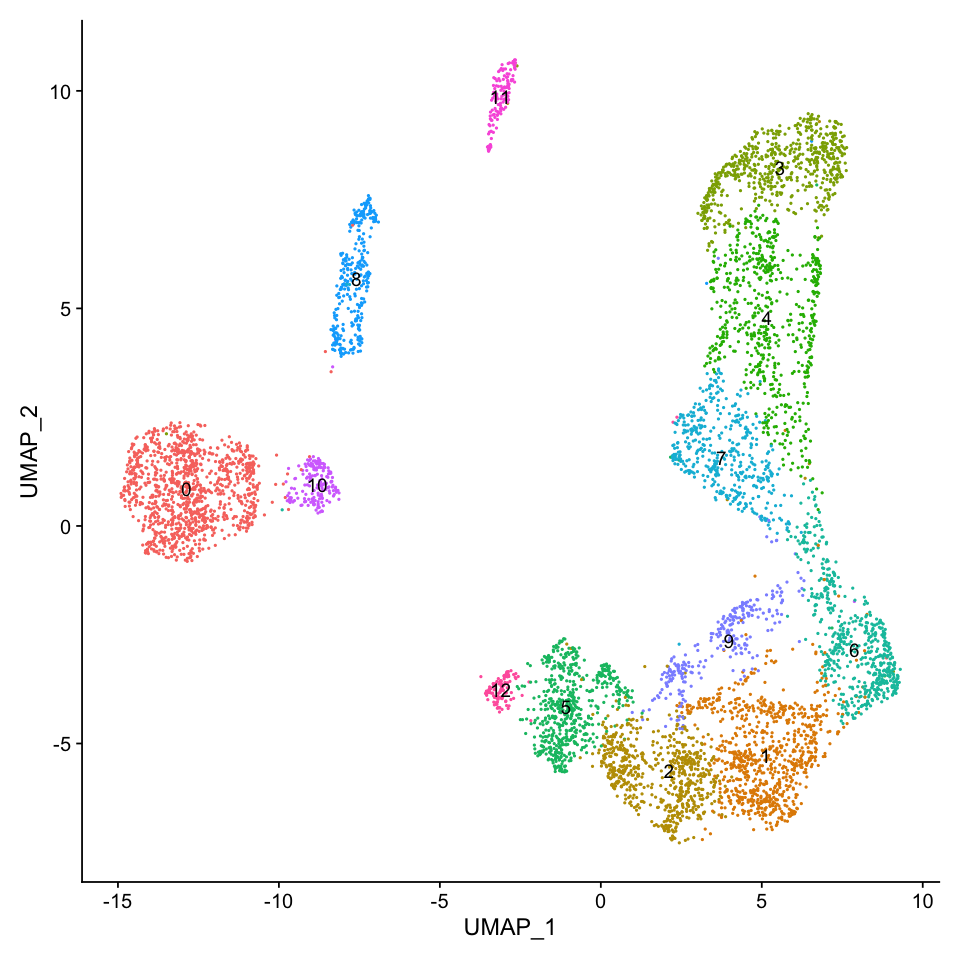

In [48]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
seu_HQC2 <- RunTSNE(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

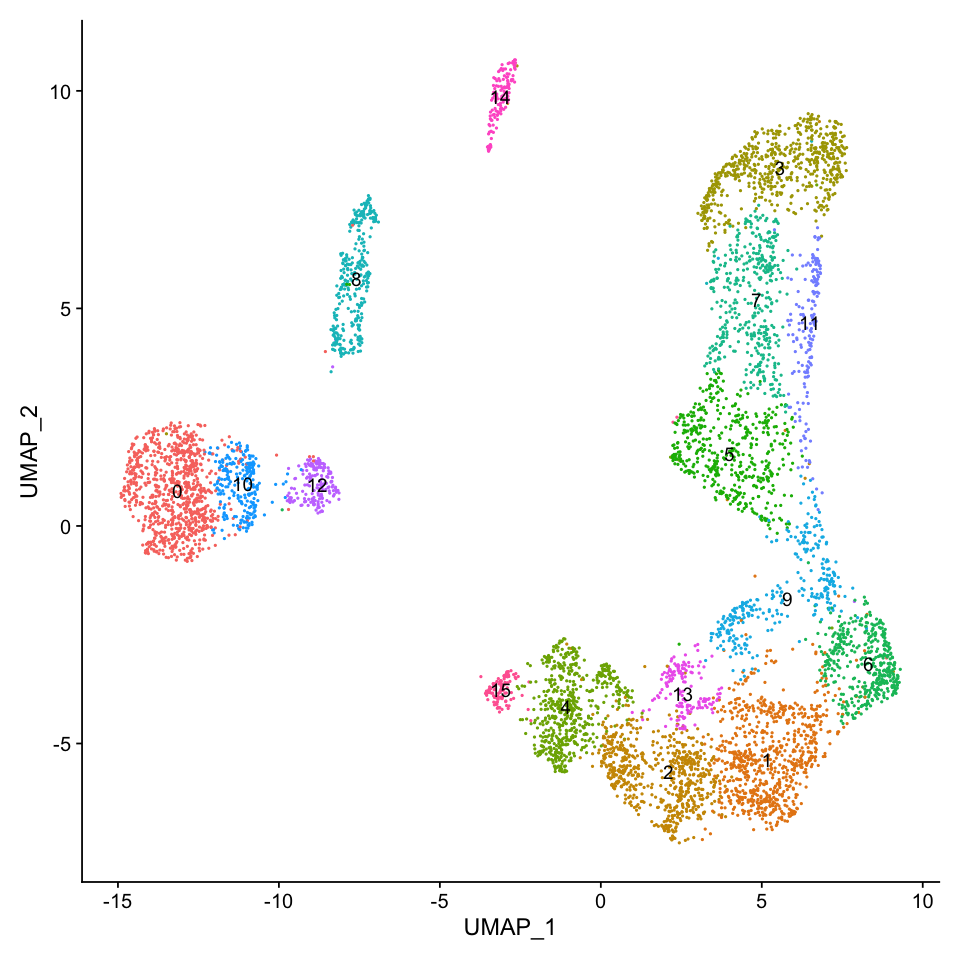

In [49]:
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE, resolution=1)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

In [50]:
all.markers2 <- FindAllMarkers(object = seu_HQC2, only.pos = TRUE)
all.markers2.top10 <- all.markers2 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15



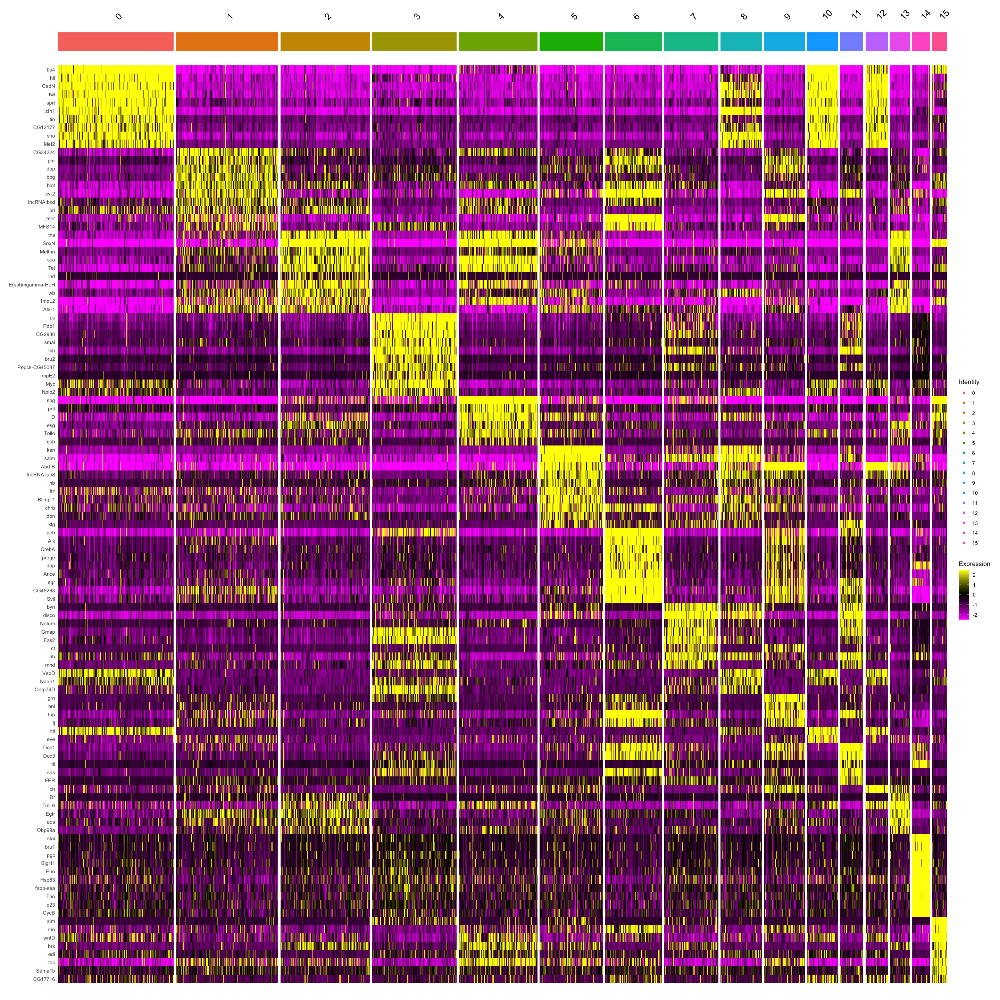

In [51]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers2.top10$gene)

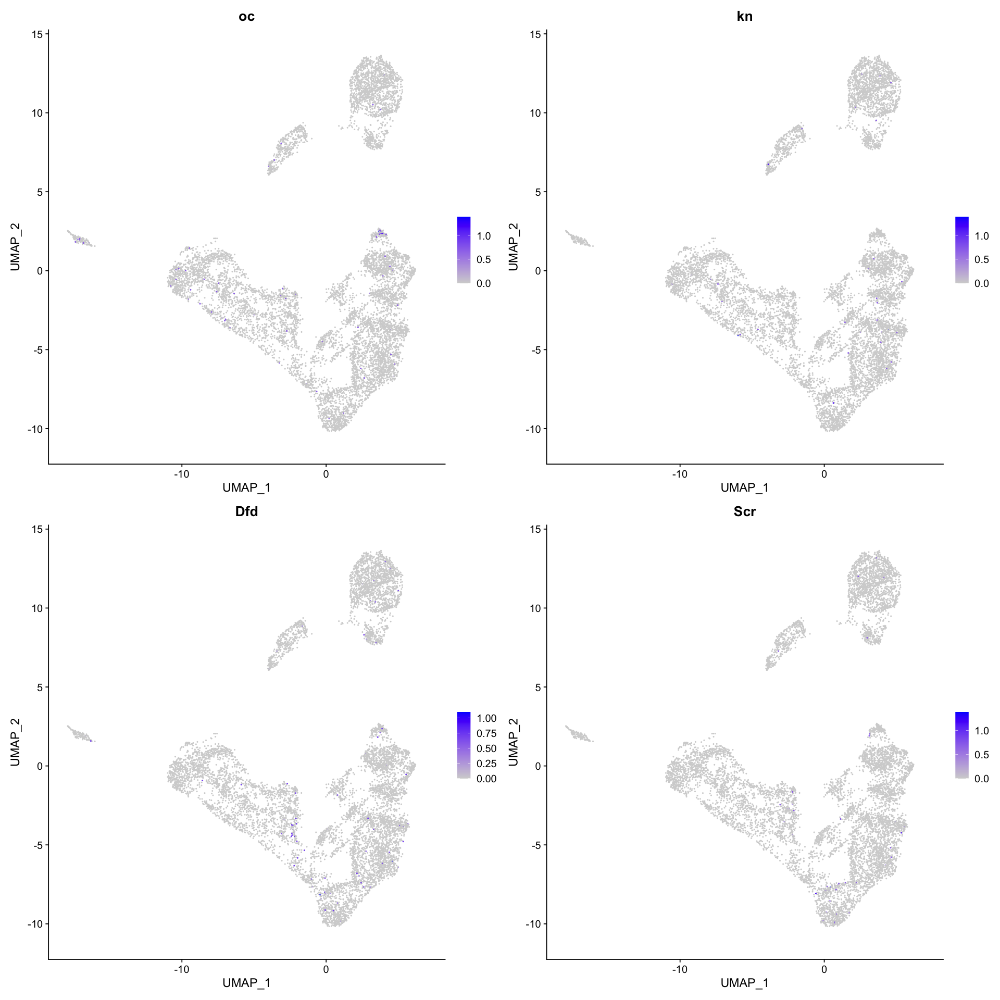

In [52]:
#Major marker genes of anterior region
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("oc","kn", "Dfd", "Scr"), pt.size = 0.2,  ncol = 2)

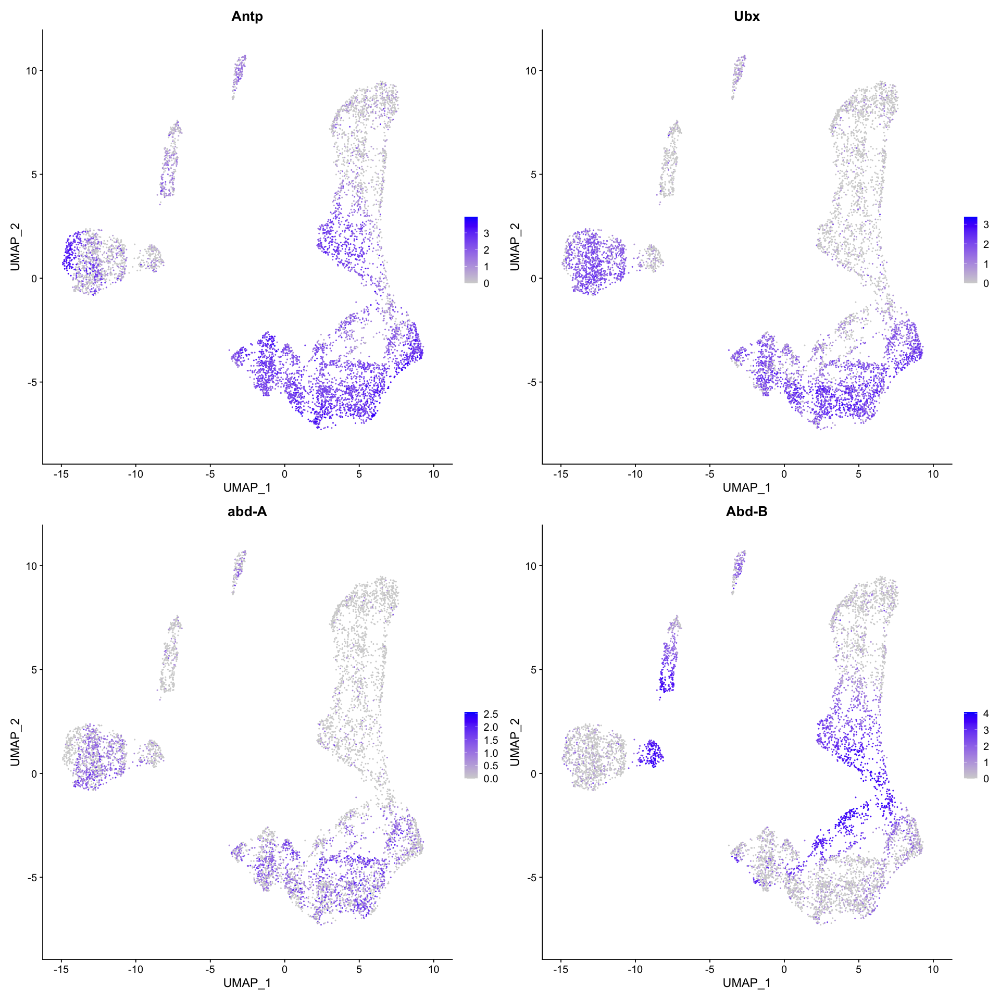

In [53]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, reduction = "umap", features = c("Antp","Ubx", "abd-A", "Abd-B"), pt.size = 0.2,  ncol = 2)

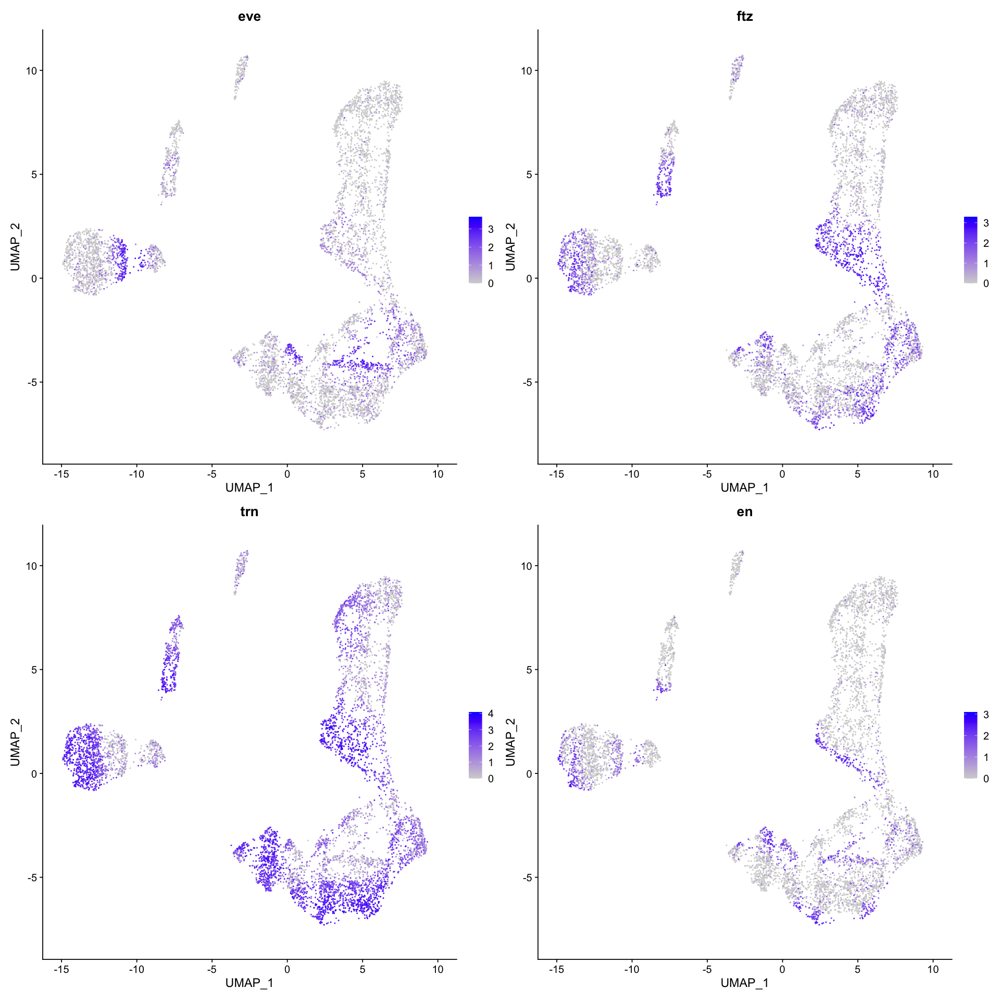

In [54]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, reduction = "umap", features = c("eve","ftz", "trn", "en"), pt.size = 0.2,  ncol = 2)

In [55]:
manual_ID <- as.data.frame(seu_HQC2$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID$manual_ID <- dplyr::recode(manual_ID$manual_ID, 
                                        "0" = "Trunk_mesoderm",
                                        "1" = "Trunk_dorsal_ectoderm",
                                        "2" = "Trunk_lateral_neuroectoderm",
                                        "3" = "Posterior_midgut",
                                        "4" = "Trunk_medial_neuroectoderm",
                                        "5" = "Ectoderm_PS14",
                                        "6" = "Amnioserosa",
                                        "7" = "Hindgut",
                                        "8" = "Posterior_mesoderm",
                                        "9" = "Dorsal_ectoderm_PS13",
                                        "10" = "Trunk_mesoderm_eve+",
                                        "11" = "Dorsal_hindgut",
                                        "12" = "Mesoderm_PS13",
                                        "13" = "Lateral_ectoderm_PS13",
                                        "14" = "Pole_cells",
                                        "15" = "Midline_cells"
                                     )
head(manual_ID)

,manual_ID
,<fct>
AAACCCACAAGACCTT,6
AAACCCACATGGAATA,2
AAACCCAGTTGTGGAG,10
AAACCCATCACAGAGG,3
AAACCCATCTGGGTCG,4
AAACGAAGTAGAGGAA,9


,manual_ID
,<fct>
AAACCCACAAGACCTT,Amnioserosa
AAACCCACATGGAATA,Trunk_lateral_neuroectoderm
AAACCCAGTTGTGGAG,Trunk_mesoderm_eve+
AAACCCATCACAGAGG,Posterior_midgut
AAACCCATCTGGGTCG,Trunk_medial_neuroectoderm
AAACGAAGTAGAGGAA,Dorsal_ectoderm_PS13


In [56]:
seu_HQC2$annotated_seurat_clusters <- manual_ID

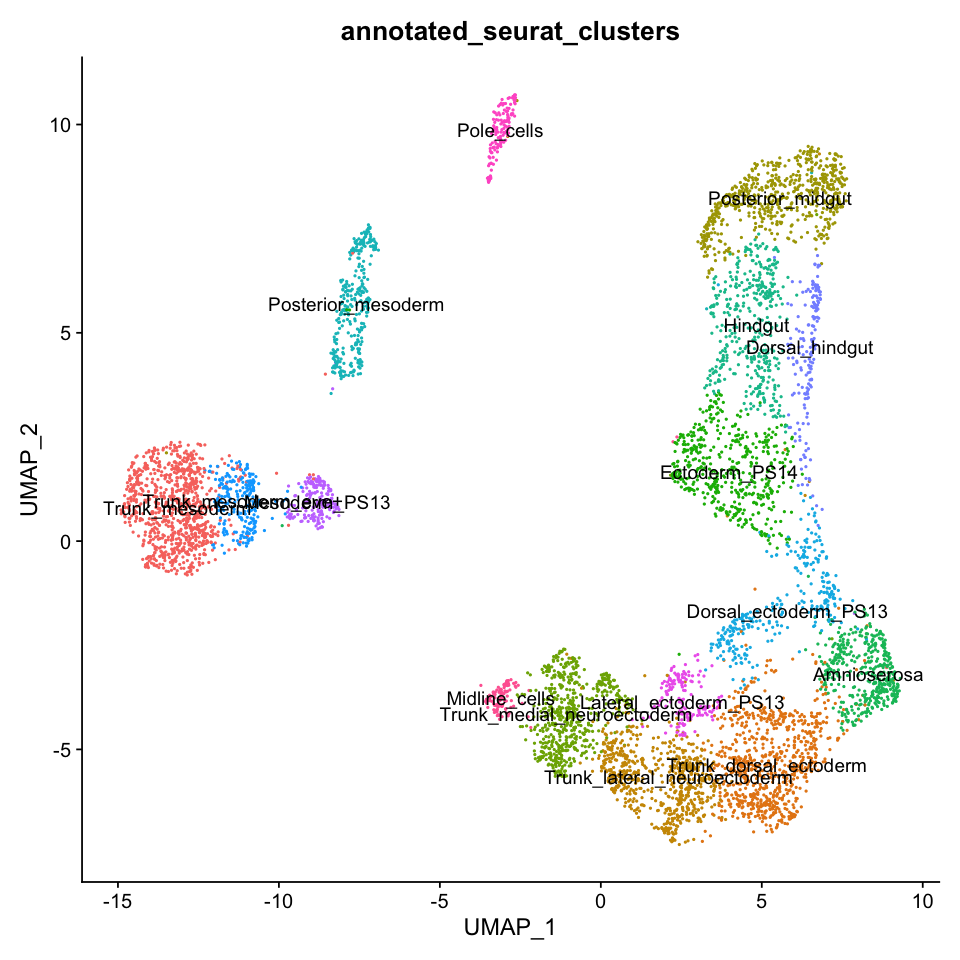

In [57]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

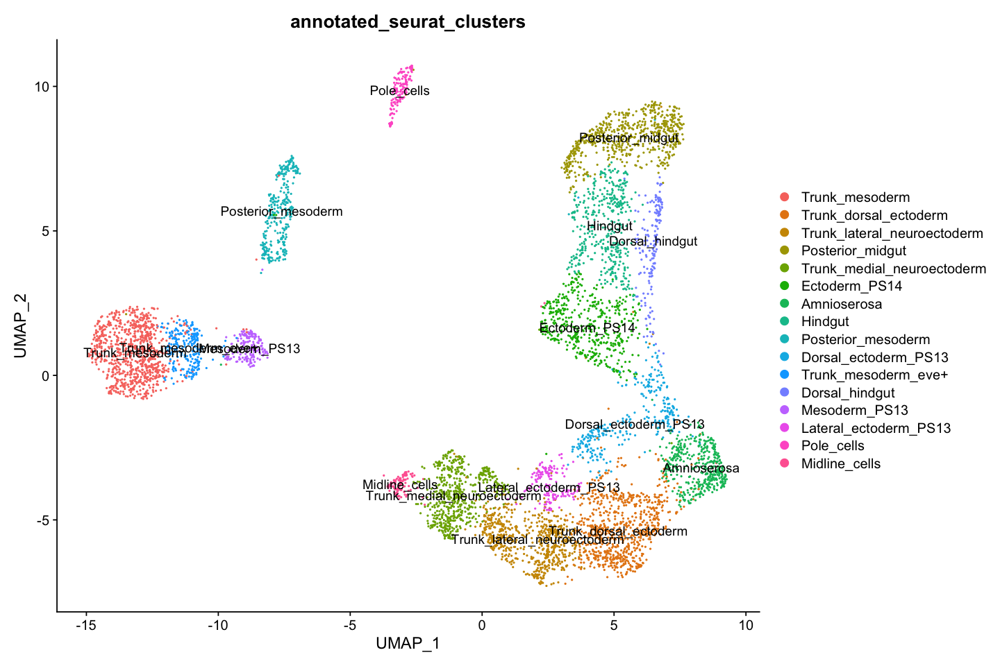

In [58]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap",, group.by = 'annotated_seurat_clusters', label = TRUE) 

In [59]:
write.table(manual_ID, 
            file="./seu_HQC2_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [60]:
saveRDS(seu_HQC2, file = "../../data/seurat_object/bcdRNAi/seu_HQC2_bcdRNAi.obj")
write.table(all.markers2, file="./seu_HQC2_all.markers.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [61]:
levels <- read.table(file="./seurat_clusters_levels_color_without_tsr_high.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)
setdiff(seu_HQC2$annotated_seurat_clusters, levels)

[1] "Trunk_dorsal_ectoderm"       "Trunk_lateral_neuroectoderm"
[3] "Trunk_medial_neuroectoderm"  "Dorsal_ectoderm_PS13"       
[5] "Lateral_ectoderm_PS13"       "Ectoderm_PS14"

[1] 16

[1] "olivedrab1"  "olivedrab3"  "olivedrab4"  "chartreuse4" "forestgreen"
[6] "darkgreen"

character(0)

In [62]:
Idents(seu_HQC2) <- 'annotated_seurat_clusters'
levels(seu_HQC2) <- levels

Saving 7 x 7 in image



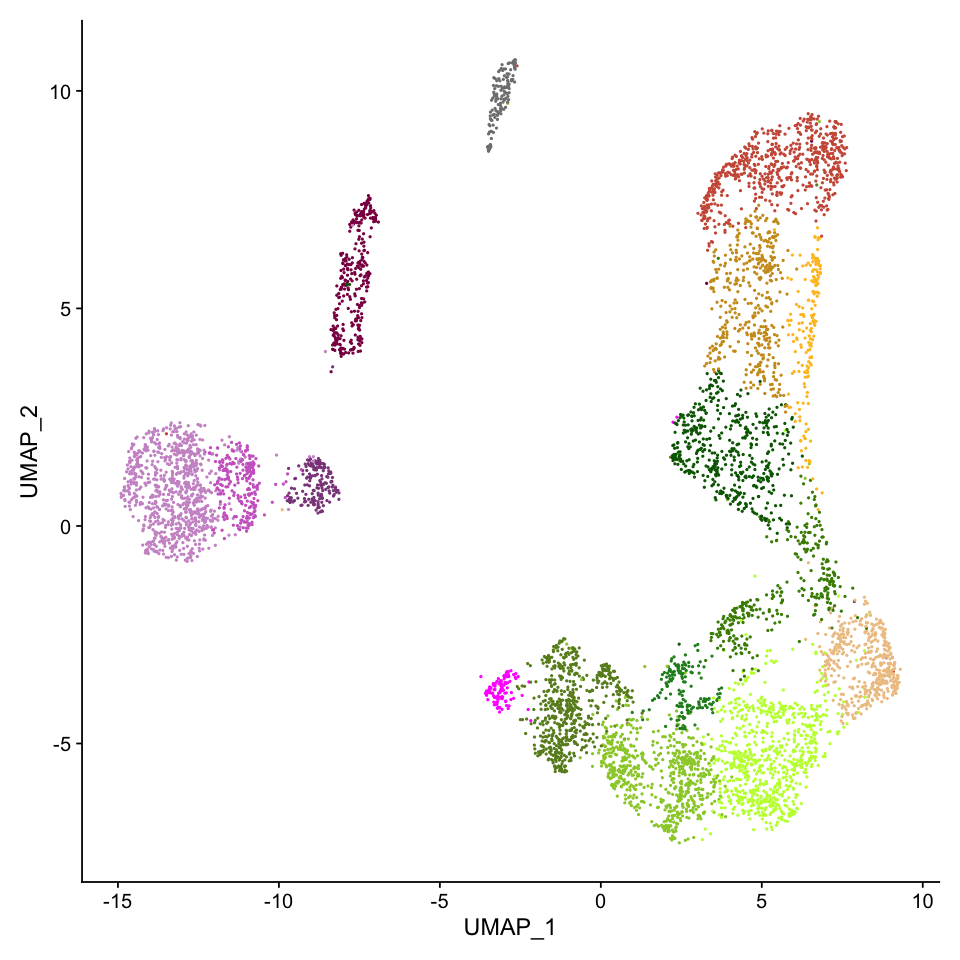

In [64]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_filter_stressed_cell_bcdRNAi/all_cells_umap_seurat_clusters_bcdRNAi.eps", dpi = 300)

Saving 7 x 7 in image



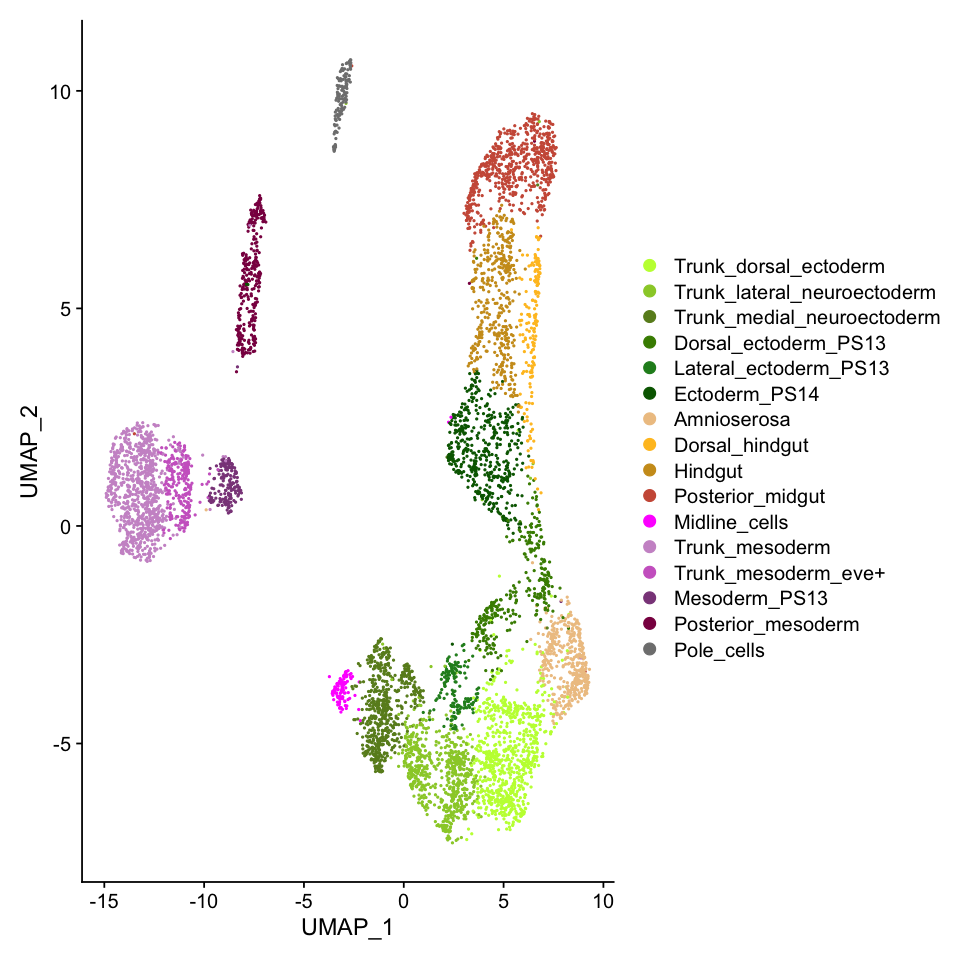

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/02_filter_stressed_cell_bcdRNAi/all_cells_umap2_seurat_clusters_bcdRNAi.eps", dpi = 300)

In [66]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'bcdRNAi_all_cells_without_tsr_high.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [67]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'bcdRNAi_all_cells_without_tsr_high_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [68]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] corrr_0.4.3                 mclust_5.4.7               
 [3] viridis_0.5.1               viridisLite_0.3.0          
 [5] MAST_1.16.0                 SingleCellExperiment_1.12.0
 [7] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [9] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
[11] IRanges_2.24.1              S4Vectors_0.28.1           
[13] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[15] matrixStats_0.57.0          RColorBrewer_1